

# Convolutional neural network for fresh and rotten fruit detection

##Importing the libraries

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
import matplotlib.pyplot as plt
import seaborn as sns
import zipfile
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

## Loading the images




In [ ]:
#mounting Google Drive in Google Colab

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Extracting Zip file from Google drive to Google Colab

path = '/content/drive/MyDrive/freshRotten (1).zip'
zip_object = zipfile.ZipFile(file=path, mode='r')
zip_object.extractall('./')
zip_object.close()

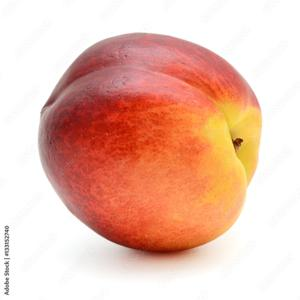

In [ ]:
#Image is displayed from training dataset

load_img('/content/freshRotten/train/fresh_peaches_done/fresh_peach_1.jpg')

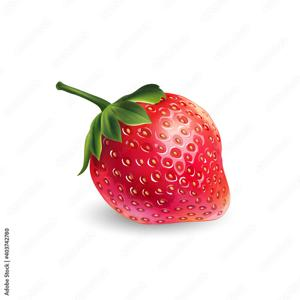

In [ ]:
load_img('/content/freshRotten/train/fresh_strawberries_done/fresh_strawberry_10.jpg')

## Train and test set

In [ ]:
# We can configure some parameters to make modifications to the original images,
# which is very useful when we have few images of each class.
# As you can see here, there are many other parameters that can be configured.
# Using this function, in addition to the original images, we will also have new images
# with application of these pre-processing
#1. is used to ensure the division performed as a floating point operation
training_generator = ImageDataGenerator(rescale=1./255,
                                        rotation_range=7,
                                        horizontal_flip=True,
                                        zoom_range=0.2)
# Indicates that the images will be accessed every eight. As we have few images, we put this small value

# As the name suggests, this parameter will mix the images,
# they will be accessed in a completely random order to prevent the neural network
# from memorizing the order of the images. Otherwise, the neural network could
# learn the order of the images and not their features
train_dataset = training_generator.flow_from_directory('/content/freshRotten/train',
                                                        target_size = (224, 224),
                                                        batch_size = 8,
                                                        class_mode = 'categorical',
                                                       shuffle = True)

Found 1547 images belonging to 6 classes.


In [ ]:
# To test, we set this parameter to FALSE because when testing,
# the order of the images makes no difference.
# If we leave the value equals TRUE, we will not be able to associate the
# predictions with the expected outputs
test_generator = ImageDataGenerator(rescale=1./255)
test_dataset = test_generator.flow_from_directory('/content/freshRotten/test',
                                                     target_size = (224, 224),
                                                     batch_size = 1,
                                                     class_mode = 'categorical',
                                                     shuffle = False)

Found 108 images belonging to 6 classes.


## Building and training the neural network

In [ ]:
#Building 5 convolutional layers with 3x3X32(image_height,image_width,Channels)filters
#ReLu Activation Function is used
#5 Maxpooling are used, each using size 2x2
#All these layers are converted into 1D through Flatten for using Fully Connected(Dense) Layers
#Finally the Output Layer contains 6 classes and softmax activation is used

network=Sequential()
network.add(Conv2D(32,(3,3),activation='relu',input_shape=(224,224,3)))
network.add(MaxPooling2D(pool_size=(2,2)))

network.add(Conv2D(32,(3,3),activation='relu'))
network.add(MaxPooling2D(pool_size=(2,2)))

network.add(Conv2D(32,(3,3),activation='relu'))
network.add(MaxPooling2D(pool_size=(2,2)))

network.add(Conv2D(32,(3,3),activation='relu'))
network.add(MaxPooling2D(pool_size=(2,2)))

network.add(Conv2D(64,(3,3),activation='relu'))
network.add(MaxPooling2D(pool_size=(2,2)))

network.add(Conv2D(64,(3,3),activation='relu'))
network.add(MaxPooling2D(pool_size=(2,2)))

network.add(Flatten())

network.add(Dense(units=577,activation='relu'))
network.add(Dense(units=577,activation='relu'))
network.add(Dense(units=6,activation='softmax'))

In [ ]:
#Preparing or Configuring the model for training
#Adam optimizer is used for updating weights during back propagation
#Categorical_crossentropy is used for loss parameter to explain how well the model explains with observed data.
#loss function is the difference between actual and predicted values
#Accuracy is used to evaluate the model with the test data

network.compile(optimizer='Adam', loss='categorical_crossentropy', metrics = ['accuracy'])

In [ ]:
#training the model with 20 epochs

history = network.fit_generator(train_dataset, epochs=30)

Epoch 1/30


<ipython-input-33-188f7bec3014>:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = network.fit_generator(train_dataset, epochs=30)


194/194 [==============================] - 22s 111ms/step - loss: 1.5635 - accuracy: 0.3297
Epoch 2/30
194/194 [==============================] - 19s 97ms/step - loss: 1.4367 - accuracy: 0.4176
Epoch 3/30
194/194 [==============================] - 19s 97ms/step - loss: 1.3146 - accuracy: 0.4758
Epoch 4/30
194/194 [==============================] - 19s 97ms/step - loss: 1.2122 - accuracy: 0.5113
Epoch 5/30
194/194 [==============================] - 20s 101ms/step - loss: 1.1690 - accuracy: 0.5423
Epoch 6/30
194/194 [==============================] - 19s 96ms/step - loss: 1.0785 - accuracy: 0.5850
Epoch 7/30
194/194 [==============================] - 20s 103ms/step - loss: 1.0430 - accuracy: 0.6025
Epoch 8/30
194/194 [==============================] - 19s 97ms/step - loss: 0.9835 - accuracy: 0.6057
Epoch 9/30
194/194 [==============================] - 20s 104ms/step - loss: 0.9253 - accuracy: 0.6451
Epoch 10/30
194/194 [==============================] - 19s 97ms/step - loss: 0.8665 - acc

## Evaluating the neural network

In [ ]:
#Displaying the class names with corresponding index values
test_dataset.class_indices

{'fresh_peaches_done': 0,
 'fresh_pomegranates_done': 1,
 'fresh_strawberries_done': 2,
 'rotten_peaches_done': 3,
 'rotten_pomegranates_done': 4,
 'rotten_strawberries_done': 5}

In [ ]:
#Predictions on the test data
#Predictions will gives the probability of the test image with each class
predictions = network.predict(test_dataset)
predictions

108/108 [==============================] - 1s 5ms/step


array([[5.30037522e-01, 7.72449421e-04, 1.49848656e-05, 4.68427509e-01,
        5.75850601e-04, 1.71725085e-04],
       [9.99694347e-01, 2.82660418e-04, 2.00593149e-07, 2.24788491e-05,
        8.40479544e-08, 2.34117152e-07],
       [9.84836400e-01, 5.24364132e-03, 6.46346831e-04, 8.98684654e-03,
        1.07633576e-04, 1.79236667e-04],
       [9.98458147e-01, 1.11232873e-03, 1.89805251e-05, 4.01554018e-04,
        7.81883841e-07, 8.29996861e-06],
       [3.66681218e-01, 1.76468100e-02, 7.76315248e-03, 4.37332511e-01,
        4.34532017e-02, 1.27123132e-01],
       [9.62049305e-01, 3.48541979e-03, 5.82351531e-05, 3.40211540e-02,
        2.73691956e-04, 1.12256988e-04],
       [7.54220366e-01, 8.05430871e-04, 4.32672778e-06, 2.44566843e-01,
        3.74551775e-04, 2.84814469e-05],
       [9.86416936e-01, 6.31258881e-04, 6.01434704e-06, 1.29195051e-02,
        1.39845224e-05, 1.24066501e-05],
       [7.87151039e-01, 1.42987221e-01, 6.21494604e-03, 3.49421017e-02,
        1.36282621e-02, 

In [ ]:
#convert the output of a neural network
#typically it consists of probabilities for each class
#selecting the index value of the class with the highest probability (argmax).
predictions = np.argmax(predictions, axis = 1)
predictions

array([0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 0, 0, 0, 1, 1, 1, 2,
       1, 1, 1, 1, 1, 1, 1, 1, 4, 0, 3, 1, 3, 1, 5, 5, 2, 2, 2, 2, 5, 5,
       2, 5, 2, 5, 2, 2, 2, 2, 2, 2, 3, 1, 3, 3, 3, 3, 3, 4, 3, 4, 4, 3,
       3, 3, 3, 4, 3, 3, 3, 5, 5, 5, 3, 5, 4, 5, 4, 4, 4, 4, 4, 4, 4, 1,
       4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 5, 5, 5, 5, 5, 5])

In [ ]:
#classes of your actaul test dataset

test_dataset.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5],
      dtype=int32)

In [ ]:
#Accuracy is measured using actual data with predicted data
from sklearn.metrics import accuracy_score
accuracy_score(test_dataset.classes, predictions)

0.7407407407407407

Text(50.722222222222214, 0.5, 'True Labels')

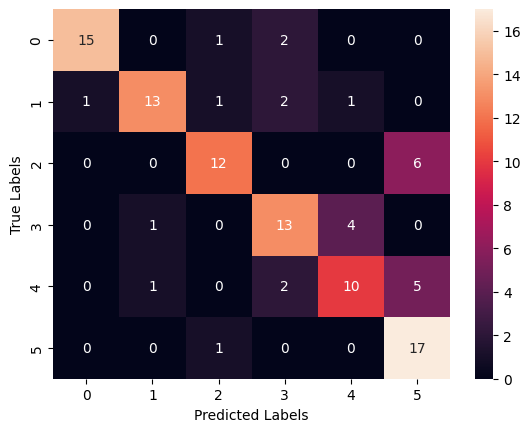

In [ ]:
#Confusion matrix based on the true labels from your test dataset and the predictions made by your model.

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(test_dataset.classes, predictions)
sns.heatmap(cm, annot=True)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')

## Classifying one single image

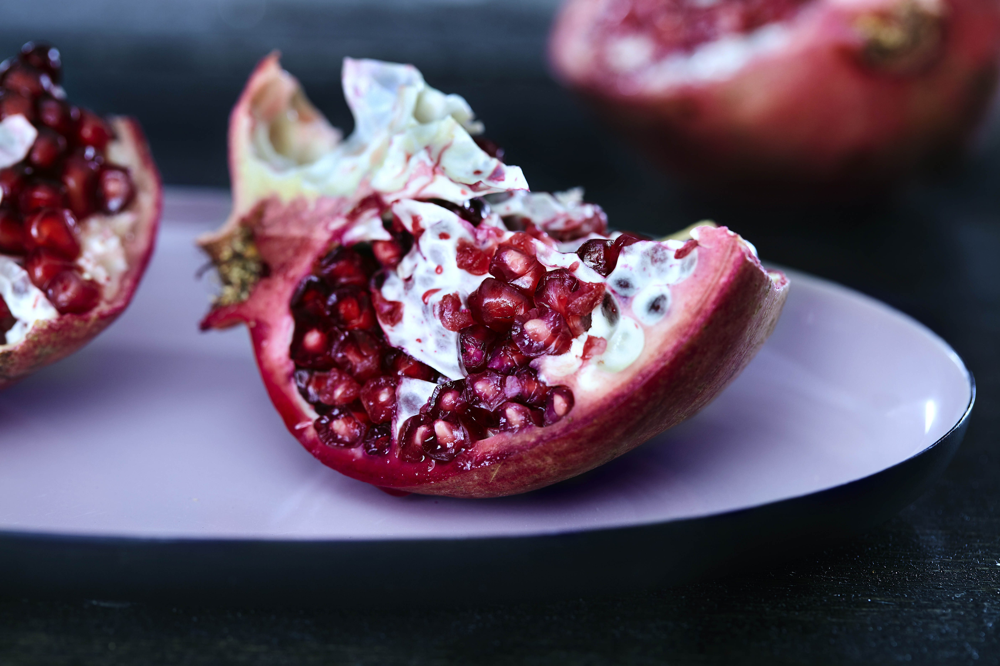

In [ ]:
#Test with an image
img = cv2.imread('/content/pomgr.jpg')
cv2_imshow(img)

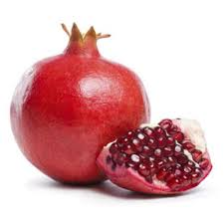

In [ ]:
#Resizing the images as 224x224
img = cv2.resize(img, (224, 224))
cv2_imshow(img)

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)
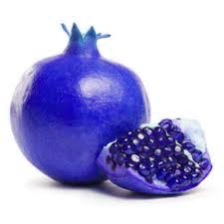

In [ ]:
img

In [ ]:
#Convert the pixel values between 0 to 1
image = img / 255
image

array([[[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.],
        ...,
        [1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]],

       [[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.],
        ...,
        [1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]],

       [[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.],
        ...,
        [1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]],

       ...,

       [[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.],
        ...,
        [1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]],

       [[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.],
        ...,
        [1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]],

       [[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.],
        ...,
        [1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]]])

In [ ]:
#Shape of the image
image.shape

(224, 224, 3)

In [ ]:
#Adding an extra dimension to your numpy array image.
#This is often done when you want to preprocess a single image before passing it through a model that expects batched input.
#it will have shape (batch_size, height, width, channels)
image =  np.expand_dims(image, axis=0)
image.shape

(1, 224, 224, 3)

In [ ]:
#Prediction(Probabilities) on the test image with each classes
result = network.predict(image)
result

1/1 [==============================] - 0s 18ms/step


array([[0.04648867, 0.05135716, 0.00167755, 0.50900245, 0.36220363,
        0.02927057]], dtype=float32)

In [ ]:
#Taking the index values with highest probability
res = np.argmax(result)
res

3

In [ ]:
#Creating a list with each index value has its corresponding class names
class_labels = ['fresh peach', 'fresh pomegranate','fresh strawberries','rotten peach', 'rotten pomegranate','rotten strawberries']

In [ ]:
#Predicted class is displayed
#If the probability of the predicted class is greater than 0.65, it display the Predicted Class
#Otherwise it display Unknown
predicted_class = class_labels[res]
if(result[0][res]>=0.65):# Assuming you have a list of class labels
      print("Predicted vegetable:", predicted_class)
else:
      print("unknown")

unknown
